In [1]:
import numpy as np
import os
import sys
import pandas as pd
import seaborn as sns

import pylab as pl
import h5py

import tensorflow as tf
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, precision_recall_fscore_support

os.environ['TF_CPP_MIN_LOG_LEVEL']='2'
os.environ['CUDA_VISIBLE_DEVICES']="0" 

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)


from sklearn.metrics import confusion_matrix

base_dir = '/media/tord/T7/Thesis_ssd/MasterThesis3'
os.chdir(base_dir)
from Classes.DataProcessing.LoadData import LoadData
from Classes.DataProcessing.HelperFunctions import HelperFunctions
from Classes.DataProcessing.DataHandler import DataHandler
from Classes.Modeling.TrainSingleModelRam import TrainSingleModelRam
from Classes.DataProcessing.RamLoader import RamLoader

from GlobalUtils import GlobalUtils

utils = GlobalUtils()


import sys


helper = HelperFunctions()

tf.config.optimizer.set_jit(True)
mixed_precision.set_global_policy('mixed_float16')

1 Physical GPUs, 1 Logical GPUs

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: GeForce RTX 3090, compute capability 8.6


In [2]:
load_args = {
    'earth_explo_only' : False,
    'noise_earth_only' : False,
    'noise_not_noise' : False,
    'downsample' : True,
    'upsample' : False,
    'frac_diff' : 1,
    'seed' : 1,
    'subsample_size' : 0.25,
    'balance_non_train_set' : False,
    'use_true_test_set' : False,
    'even_balance' : False,
    'load_nukes': True
}
loadData = LoadData(**load_args)
train_ds = loadData.train
nukes_ds = loadData.nukes_ds
handler = DataHandler(loadData)



Mapping train redundancy: : [--------------------------------------->] 100 %



In [3]:
train_ds.shape

(46234, 3)

In [4]:
use_time_augmentor = True
scaler_name = "normalize"
use_noise_augmentor = True
filter_name = None
band_min = 2.0
band_max = 4.0
highpass_freq = 0.075


shutdown = False

num_classes = len(list(set(loadData.label_dict.values())))



ramLoader = RamLoader(loadData, 
                      handler, 
                      use_time_augmentor = use_time_augmentor, 
                      use_noise_augmentor = use_noise_augmentor, 
                      scaler_name = scaler_name,
                      filter_name = filter_name, 
                      band_min = band_min,
                      band_max = band_max,
                      highpass_freq = highpass_freq, 
                      load_test_set = False, 
                      meier_load = False)

x_nuke, y_nuke, noiseAug = ramLoader.load_to_ram()

Initializing loading of the nukes.
Step 1: Fit augmentors and scalers on training data. As normalized scaler is assumed to be used, only the noise events are loaded.


Fitting train time augmentor: [--------------------------------------->] 100 %

Fit process completed after 8.391548871994019 seconds. Total datapoints fitted: 22529.
Average time per datapoint: 0.000372477645345733




Stage one loading training set, timeAug: [--------------------------------------->] 100 %

Fit process of normalizer skipped as unecessary




Stage two loading training set, labels and normalize scaler: [--------------------------------------->] 100 %



Fitting noise augmentor: [--------------------------------------->] 100 %

Step 2: Load and transform the test set, using the previously fitted scaler and augmentors
Stage one loading nuclear set, timeAug: [--------------------------------------->] 100 %

Stage two loading nuclear set, labels and normalize scaler: [--------------------------------------->] 100 %

Time elapsed to completion of load_to_ram_nukes: 0:00:32.076326


In [4]:
from Classes.DataProcessing.RamGen import RamGen

In [57]:
j = 7

(3, 6000)
(3, 12001)


/home/tord/miniconda3/envs/thesis/lib/python3.8/site-packages/obspy/imaging/util.py:275: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/home/tord/miniconda3/envs/thesis/lib/python3.8/site-packages/obspy/imaging/waveform.py:820: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


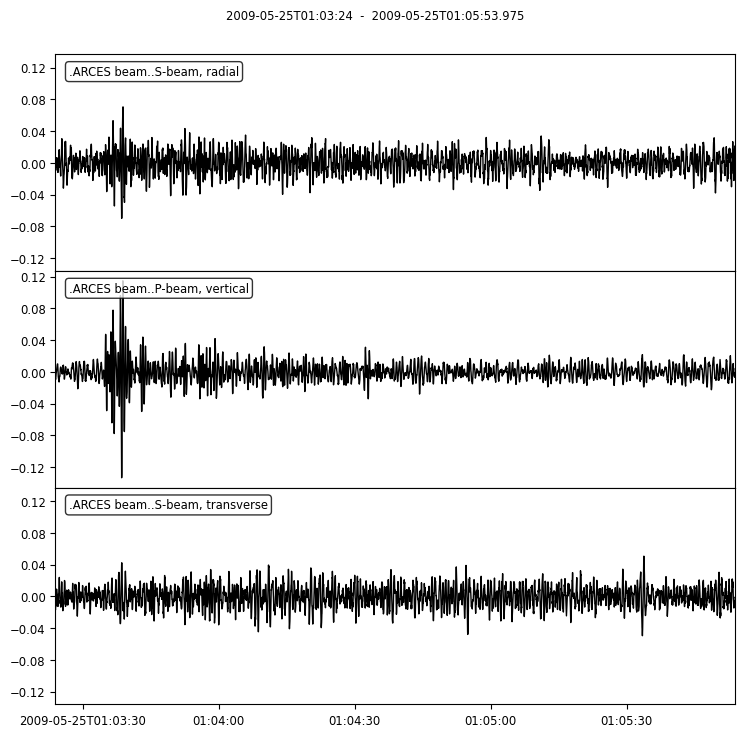

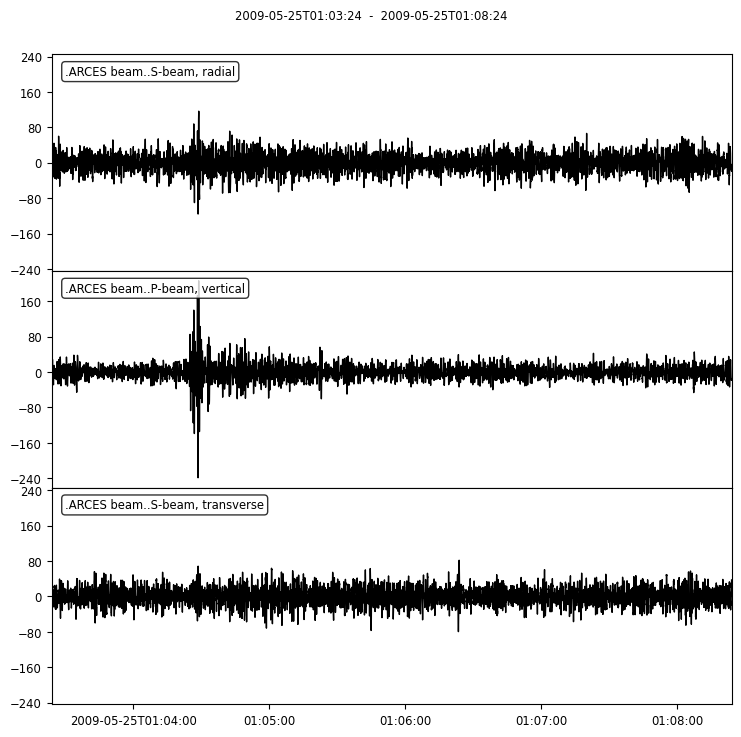

{'event_type': 'nuclear explosion',
 'event_type_certainty': 'known',
 'origins': [{'time': '2009-05-25T00:54:43.000000Z',
   'longitude': 41.299,
   'latitude': 129.075,
   'depth': 0.0,
   'region': 'Punggye-ri test-site'}],
 'magnitudes': [{'mag': 4.7, 'magnitude_type': 'MB'}],
 'est_arrivaltime': '2009-05-25T01:04:24.000000Z',
 'trace_stats': {'starttime': '2009-05-25T01:03:24.000000Z',
  'sampling_rate': 40.0,
  'station': 'ARCES beam',
  'channels': ['P-beam, vertical', 'S-beam, transverse', 'S-beam, radial']}}

In [58]:
nuke_sample = nukes_ds[j]
trace, info = handler.path_to_trace(nuke_sample[0])
trans_trace = x_nuke[j]
print(trans_trace.shape)
print(trace.shape)
helper.plot_event(trans_trace, info)
helper.plot_event(trace, info)
info

In [ ]:
original_trace, sample_info = handler.path_to_trace(val_ds[i[0])
transformed_trace = x_val[index]
print(f"Predicted label: {predictions[index]}, Correct: {y_val[index]}")
print("Transformed")
helper.plot_event(transformed_trace, sample_info)
helper.plot_event(original_trace, sample_info)
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(sample_info)
i += 1

In [17]:
# Path of the best performing model on Noise vs Not-Noise
save_dir_3n = '/media/tord/T7/Thesis_ssd/SavedModels/CNN'
model_name_3n = 'CNN_3N_final'
model_3n_path = f'{save_dir_3n}/{model_name_3n}'
# This model is trained with batch_size of 256
# Batch size will be 1 for predictions
print(model_3n_path)
model_3n = helper.load_model(model_3n_path)



# Path of the best performing model on Explosion vs Earthquake
save_dir_ee = '/media/tord/T7/Thesis_ssd/SavedModels/CNN'
model_name_ee = 'CNN_EE_final'
model_ee_path = f'{save_dir_ee}/{model_name_ee}'
# This model is trained with batch_size of 256
# Batch size will be 1 for predictions
model_ee = helper.load_model(model_ee_path)


/media/tord/T7/Thesis_ssd/SavedModels/CNN/CNN_3N_final


In [37]:
import time

def predict_final_model(loadData, model_3n, model_ee, test_traces, test_labels, noiseAug, num_channels_3n, num_channels_ee):
    # This function assumes data to be preprocessed with normalize scaler
    
    noise_not_noise_dict = loadData.noise_not_noise_dict()
    start = time.time()
    predictions_3n = helper.predict_RamGenerator(model_3n, test_traces, test_labels, 1, True, noiseAug, None, num_channels_3n, final_eval = True)
    print(f"Completed 3N predictions after f{round(time.time()-start)} seconds. Amount of predictions: {len(test_labels)}")
    print(f"Average time per datapoint: {(time.time() - start)/len(test_labels)}")
    print(predictions_3n)
    rounded_3n_predictions = np.rint(predictions_3n)
    
    
    earth_explo_dict = loadData.earth_explo_dict()
    not_noise_traces, not_noise_labels = get_not_noise_traces_labels(predictions_3n, test_traces, test_labels, noise_not_noise_dict)
    ee_start = time.time()
    predictions_ee = helper.predict_RamGenerator(model_ee, not_noise_traces, not_noise_labels, 1, True, noiseAug, None, num_channels_ee, final_eval = True)
    print(f"Completed 3N predictions after f{round(time.time()-ee_start)} seconds. Amount of predictions: {len(test_labels)}")
    print(f"Average time per datapoint: {(time.time() - ee_start)/len(test_labels)}")
    print(predictions_ee)
    rounded_ee_predictions = np.rint(predictions_ee)
    
    # Converting the 3N predictions into string
    dict_3n = {'noise' : 0, 'not_noise' : 1}
    converted_3n_predictions = convert_predictions(rounded_3n_predictions, dict_3n)
    print(converted_3n_predictions)
    # We now have a list of ["noise", "not-noise"...]
    # We want to take the not-noise elements and convert them into their final predictions.
    # We can do this by using a list of indexes of the not noise elements, and replace them by their true final predictions.
    not_noise_indexes = get_not_noise_indexes(rounded_3n_predictions, noise_not_noise_dict)
    

    end = time.time()
    print(f"Prediction of {len(test_labels)} complete. Process took {round(end-start)} seconds")
    print(f"Average time per datapoint: {(end-start)/len(test_labels)}")
    print(convert_ee_predictions(rounded_ee_predictions, earth_explo_dict, converted_3n_predictions, not_noise_indexes))
    return convert_ee_predictions(rounded_ee_predictions, earth_explo_dict, converted_3n_predictions, not_noise_indexes)
    
def get_not_noise_indexes(rounded_predictions, noise_not_noise_dict):
    not_noise_indexes = np.where(rounded_predictions == 1)[0]
    return not_noise_indexes
    
def get_not_noise_traces_labels(predictions, test_traces, test_labels, noise_not_noise_dict):
    rounded_predictions = np.rint(predictions)
    not_noise_indexes = get_not_noise_indexes(rounded_predictions, noise_not_noise_dict)
    not_noise_traces = test_traces[not_noise_indexes][:]
    not_noise_labels = test_labels[not_noise_indexes]
    return not_noise_traces, not_noise_labels

def convert_ee_predictions(rounded_predictions, label_dict, converted_3n_predictions, not_noise_indexes):
    final_predictions = converted_3n_predictions.copy()
    converted_ee_predictions = convert_predictions(rounded_predictions, label_dict)
    for idx, nn_index in enumerate(not_noise_indexes):
        final_predictions[nn_index] = converted_ee_predictions[idx]
    return final_predictions
    
def convert_predictions(rounded_predictions, label_dict):
    transformed_predictions = np.empty((rounded_predictions.shape), dtype=object)
    # Assumes that the dictionary is sorted by ascending values. Also that the key, value pair is unique
    keys = list(label_dict.keys())
    for idx, pred in enumerate(rounded_predictions):
        transformed_predictions[idx] =  keys[int(pred[0])]
    return transformed_predictions

def transform_true_labels(true_labels, final_dict):
    output = np.empty((len(true_labels)))
    for idx, lab in enumerate(true_labels):
        output[idx] = np.where(lab == 1)[0]
    return output

import matplotlib.pyplot as plt
def plot_confusion_matrix(conf, label_dict):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    labels = list(label_dict.keys())
    for x in range(len(labels)):
        for y in range(len(labels)):
            ax.annotate(str(np.array(conf[x,y]).ravel()[0]), xy = (y, x), ha = 'center', va = 'center')
    print(labels)
    offset = 0.5
    width = height = len(labels)
    ax.set_xlim(-offset, width - offset)
    ax.set_ylim(-offset, height - offset)
    plt.title(f'Confusion matrix of the final classifier on nuclear explosion waveforms')
    #ax.set_xticklabels([''] + labels)
    #ax.set_yticklabels([''] + labels)
    ax.hlines(y=np.arange(height+1)- offset, xmin=-offset, xmax=width-offset, color  = "black")
    ax.vlines(x=np.arange(width+1) - offset, ymin=-offset, ymax=height-offset, color = "black")
    plt.xticks(range(width), labels)
    plt.yticks(range(height), labels)
    ax.invert_yaxis()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def get_all_unidentified_by_type(type_int, predictions, y_test):
    index_list = []
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    final_preds = np.array([final_dict.get(x[0]) for x in test_pred])
    final_true = transform_true_labels(y_test, final_dict)
    for i in range(len(final_true)):
        if final_true[i] == type_int and final_true[i] != final_preds[i]:
            index_list.append(i)
    return index_list

def get_distance_distribution(ds):
    total = len(ds)
    all_dist = []
    for idx, path_label in enumerate(ds):
        path, label, _ = path_label
        dist = np.rint(handler.path_to_trace(path)[1].get('dist_to_arces'))
        all_dist.append(dist)
    return all_dist

    
def get_magnitude_distribution(ds):
    total = len(ds)
    all_mag = []
    for idx, path_label in enumerate(ds):
        path, label, _ = path_label
        mag = handler.path_to_trace(path)[1].get('magnitudes')[0]['mag']
        all_mag.append(mag)
    return all_mag

def get_msrdr_distribution(ds):
    total = len(ds)
    all_msrdr = []
    for idx, path_label in enumerate(ds):
        path, label, _ = path_label
        msrdr = handler.path_to_trace(path)[1].get('magnitude_sqrtdist_ratio')
        all_msrdr.append(msrdr)
    return all_msrdr    


def get_bins_count_pdf_cdf(dist, nr_bins, minimum, maximum):
    print(f"Max dist: {max(dist)}")
    print(f"Min dist: {min(dist)}")
    count, bins_count = np.histogram(dist, bins = nr_bins, range = (minimum, maximum))
    pdf = count / sum(count)
    cdf = np.cumsum(pdf)
    return bins_count, count, pdf, cdf

def plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, width, type_int, title, xlabel, ylabel):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    plt.bar(bins_count_o[1:], counts_o, width=width, color="blue", label=f"All {key_list[type_int]}s")
    plt.bar(bins_count_u[1:], counts_u, width=width, color="red", label=f"Correctly identified {key_list[type_int]}s")
    plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.rcParams['figure.figsize'] = [10, 8]
    plt.show()

    
def broken_plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, width, type_int, low_max, high_max, title, xlabel, ylabel):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    
    fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    fig.subplots_adjust(hspace=0.01)
    # Plotting data on both axis:
    ax1.bar(bins_count_o[1:], counts_o, width = width, color = "blue", label=f"All {key_list[type_int]}s")
    ax2.bar(bins_count_o[1:], counts_o, width = width, color = "blue", label=f"All {key_list[type_int]}s")
    ax1.bar(bins_count_u[1:], counts_u, width = width, color = "red", label=f"Correctly identified {key_list[type_int]}s")
    ax2.bar(bins_count_u[1:], counts_u, width = width, color = "red", label=f"Correctly identified {key_list[type_int]}s")
    
    
    # Setting cutoff:
    ax1.set_ylim(low_max, high_max)
    ax2.set_ylim(0, low_max)
    
    ax1.spines['bottom'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.xaxis.tick_bottom()
    ax2.yaxis.tick_left()
    ax1.yaxis.tick_left()
    ax2.spines['bottom'].set_visible(True)
    ax2.spines['left'].set_visible(True)
    ax1.spines['left'].set_visible(True)
    
    # Slant of cutoff markers
    d = 0.5
    kwargs = dict(marker = [(-1, -d),(1,d)], markersize = 12, 
                  linestyle ="none", color = 'k', mec = 'k', mew = 1, clip_on = False)
    ax1.plot([0,1], [0,0], transform=ax1.transAxes, **kwargs)
    ax2.plot([0,1], [1,1], transform=ax2.transAxes, **kwargs)
    plt.xlabel(xlabel)
    fig.text(0.04, 0.5, ylabel, va='center', rotation='vertical')
    fig.text(0.30, 0.9, title, va = 'center')
    ax1.legend(loc = 'best')
    plt.show()
    
          
def plot_distances_unid(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_all_unidentified_by_type(type_int, predictions, y_test)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    counts_u = counts_o - counts_u
    
    if type_int == 1:
        low_max = 40
        high_max = 3200
        broken_plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, low_max, high_max, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")
    else:
    
        plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")

    
def plot_magnitude_unid(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_all_unidentified_by_type(type_int, predictions, y_test)
    unid = test_ds[unid]
    unid_dist = get_magnitude_distribution(unid)
    all_dist = get_magnitude_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 6)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 6)
    counts_u = counts_o - counts_u
    if type_int == 1:
        low_max = 50
        high_max = 2500
        broken_plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 0.1, type_int, low_max, high_max, f"Distribution of {key_list[type_int]} magntidues in the test set", "Magnitude", "Frequency")
    if type_int == 2:
        low_max = 10
        high_max = 150
        plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 0.1, type_int, f"Distribution of {key_list[type_int]} magntidues in the test set", "Magnitude", "Frequency")
    

def plot_msrdr_unid(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_all_unidentified_by_type(type_int, predictions, y_test)
    unid = test_ds[unid]
    unid_dist = get_msrdr_distribution(unid)
    all_dist = get_msrdr_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 60

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 0.8)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 0.8)
    counts_u = counts_o - counts_u
    if type_int == 1:
        low_max = 20
        high_max = 3000
    if type_int == 2:
        low_max = 10
        high_max = 150
    
    broken_plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 0.01, type_int, low_max, high_max, f"Distribution of {key_list[type_int]} MSRDR in the test set", "MSRDR", "Frequency")

    
    
from scipy.stats import linregress

def plot_distances_noise(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    
    if type_int == 1:
        low_max = 40
        high_max = 3200
        broken_plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, low_max, high_max, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")
    else:
    
        plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")

def plot_distances_noise_adjusted(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Distance distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Distance"
    ylabel = "Probability"
    plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
        #plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")

        
def plot_magnitude_noise_adjusted(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_magnitude_distribution(unid)
    all_dist = get_magnitude_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 6)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 6)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Magnitude distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Magnitude"
    ylabel = "Probability"
    plot_adjusted(pdf, bins_count, counts, 0.1, type_int, title, xlabel, ylabel)
    
def plot_distance_noise_both(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Distance distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Distance"
    ylabel = "Probability"
    #plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
    plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts, 50, type_int, title, xlabel, ylabel)
    
def plot_magnitude_noise_both(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_magnitude_distribution(unid)
    all_dist = get_magnitude_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 6)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 6)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Magnitude distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Magnitude"
    ylabel = "Probability"
    #plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
    plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts, 0.1, type_int, title, xlabel, ylabel)

    
def plot_msrdr_noise_both(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_msrdr_distribution(unid)
    all_dist = get_msrdr_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 60

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 0.8)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 0.8)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"MSRDR distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "MSRDR"
    ylabel = "Probability"
    #plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
    plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts, 0.01, type_int, title, xlabel, ylabel)

    
    
def plot_msrdr_noise_adjusted(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_msrdr_distribution(unid)
    all_dist = get_msrdr_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 0.8)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 0.8)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"MSRDR distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "MSRDR"
    ylabel = "Probability"
    plot_adjusted(pdf, bins_count, counts, 0.01, type_int, title, xlabel, ylabel)


def plot_adjusted(pdf, bins_count, counts, width, type_int, title, xlabel, ylabel):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    plt.bar(bins_count[1:], counts, width=width, color="red", label=f"E{key_list[type_int][1:]}s predicted to be noise, adjusted for population")
    plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.rcParams['figure.figsize'] = [10, 8]
    plt.show()

def plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts_a, width, type_int, title, xlabel, ylabel):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.subplots_adjust(hspace=0.1)
    ax1.bar(bins_count_o[1:], counts_o, width=width, color="blue", label=f"All {key_list[type_int]}s")
    ax1.bar(bins_count_u[1:], counts_u, width=width, color="red", label=f"E{key_list[type_int][1:]}s predicted \nto be noise")
    
    slope, intercept, r_value, p_value, std_err  = linregress(bins_count_u[1:], counts_a)
    
    ax2.plot(bins_count_u[1:], slope*bins_count_u[1:]+intercept, color = "red", label = f"Linear regression line. P-value: {round(p_value, 2)}\n R-value: {round(r_value, 2)}")
    print("Intercept: ", intercept)
    print("Coef: ", slope)
    print("P-value: ", p_value)
    
    #coef = np.polyfit(bins_count_u[1:], counts_a,1)
    #poly1d_fn = np.poly1d(coef) 
    # poly1d_fn is now a function which takes in x and returns an estimate for y

    #plt.plot(bins_count_u[1:], counts_a, 'yo', bins_count_u[1:], poly1d_fn(bins_count_u[1:]), '--k', color = "black")
    #plt.plot(bins_count_u[1:], counts_a, 'yo', bins_count_u[1:], poly1d_fn(bins_count_u[1:]), '--k', color = "black")
    ax2.bar(bins_count_u[1:], counts_a, width=width, color="black", label=f"E{key_list[type_int][1:]}s predicted to be noise,\n adjusted for population")
    
    
    fig.text(0.45, 0.08, xlabel, va='center')
    fig.text(0.04, 0.5, "Frequency", va='center', rotation='vertical')
    fig.text(0.48, 0.5, "Probability", va='center', rotation = 'vertical')
    fig.text(0.35, 0.9, title, va = 'center')
    ax1.legend()
    ax2.legend()
    plt.show()

def get_class_incorrectly_predicted_noise(test_pred, y_true, type_int):
    index_list = []
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    final_preds = np.array([final_dict.get(x[0]) for x in test_pred])
    print(final_preds)
    final_true = transform_true_labels(y_test, final_dict)
    for i in range(len(test_pred)):
        if final_preds[i] == 0 and final_true[i] == type_int:
            index_list.append(i)
    return index_list


def adjust_by_pop(counts_o, counts_u):
    new_counts = []
    for i in range(len(counts_o)):
        if counts_u[i] == 0:
            new_counts.append(0)
        else:
            new_counts.append(counts_u[i]/counts_o[i])
    return new_counts
    
def plot_all_plots(predictions, y_test, test_ds):
    print("Plotting errors")
    print("Distances:")
    plot_distances_unid(predictions, y_test, test_ds, 1)
    plot_distances_unid(predictions, y_test, test_ds, 2)
    print("Magnitudes:")
    plot_magnitude_unid(predictions, y_test, test_ds, 1)
    plot_magnitude_unid(predictions, y_test, test_ds, 2)
    print("MSRDR:")
    plot_msrdr_unid(predictions, y_test, test_ds, 1)
    plot_msrdr_unid(predictions, y_test, test_ds, 2)
    print("Finished")
    print("Plotting events incorrectly labeled noise:")
    print("Distances:")
    plot_distance_noise_both(test_pred, y_test, test_ds, 1)
    plot_distance_noise_both(test_pred, y_test, test_ds, 2)
    print("Magnitudes:")
    plot_magnitude_noise_both(test_pred, y_test, test_ds, 1)
    plot_magnitude_noise_both(test_pred, y_test, test_ds, 2)
    print("MSRDR:")
    plot_msrdr_noise_both(test_pred, y_test, test_ds, 1)
    plot_msrdr_noise_both(test_pred, y_test, test_ds, 2)
    
    
    
    
    

In [35]:
def evaluate_full_pipeline(test_pred, test_traces, test_labels, test_ds):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    # We now have the predictions in their string form and (assumed) in the correct ordering
    # Let us now convert the final predictions and true labels into one-hot encoding
    final_preds = np.array([final_dict.get(x[0]) for x in test_pred])
    final_true = transform_true_labels(test_labels, final_dict)
    assert len(final_preds) == len(final_true), f"preds len {len(final_preds)}, true len {len(final_true)}"
    # Should be able to attempt to print a confusion matrix now
    conf=tf.math.confusion_matrix(final_true, final_preds, num_classes = 3)
    precision, recall, fscore, _ = precision_recall_fscore_support(final_true, final_preds, beta = 2, average = "macro", zero_division = 0.0)
    report = classification_report(final_true, final_preds, target_names = final_dict)
    #plot_all_plots(test_pred, test_labels, test_ds)
    return conf, report, precision, recall, fscore
    

Completed 3N predictions after f0 seconds. Amount of predictions: 23
Average time per datapoint: 0.002974385800568954
[[ 0.98733735]
 [ 0.99413913]
 [ 0.97592735]
 [ 0.9987691 ]
 [ 0.99892324]
 [ 0.9984598 ]
 [ 0.95530134]
 [ 0.9695398 ]
 [ 0.6251324 ]
 [ 0.01095346]
 [ 0.9621682 ]
 [ 0.9919484 ]
 [ 0.9968219 ]
 [ 0.97668844]
 [ 0.8560702 ]
 [ 0.6913296 ]
 [ 0.976275  ]
 [ 0.7489254 ]
 [ 0.53872746]
 [ 0.9575272 ]
 [ 0.997752  ]
 [ 0.68163544]
 [ 0.9987709 ]]
Completed 3N predictions after f0 seconds. Amount of predictions: 23
Average time per datapoint: 0.003474961156430452
[[ 0.99998164]
 [ 0.99996257]
 [ 0.99218315]
 [ 0.9999312 ]
 [ 0.99857366]
 [ 0.99980915]
 [ 0.99993217]
 [ 0.99963915]
 [ 0.55155057]
 [ 0.99920774]
 [ 0.9999989 ]
 [ 1.        ]
 [ 0.9997167 ]
 [ 0.99906814]
 [ 0.53873557]
 [ 0.9999914 ]
 [ 0.9999976 ]
 [ 1.        ]
 [ 0.99999475]
 [ 0.9999664 ]
 [ 0.9990565 ]
 [ 0.9998448 ]]
[['not_noise']
 ['not_noise']
 ['not_noise']
 ['not_noise']
 ['not_noise']
 ['not_noise

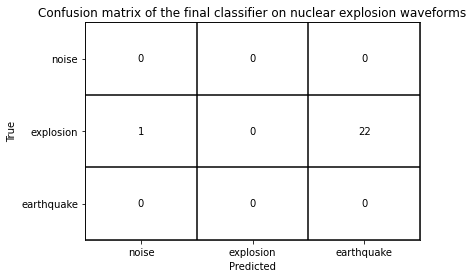

In [38]:
test_pred = predict_final_model(loadData, model_3n, model_ee, x_nuke, y_nuke, noiseAug, 3, 3)

conf, report, precision, recall, fscore  = evaluate_full_pipeline(test_pred, x_nuke, y_nuke, nukes_ds)

print(conf)
print(report)
plot_confusion_matrix(conf,{"noise" : 0, "explosion" : 1, "earthquake" : 2})

In [ ]:
plot_all_plots(test_pred, y_test, test_ds)


In [ ]:
conf

In [ ]:
print(report)

In [ ]:
fscore

In [ ]:
precision

In [25]:
print(test_pred)

[['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['noise']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']
 ['earthquake']]


In [ ]:
plot_confusion_matrix(conf,{"noise" : 0, "explosion" : 1, "earthquake" : 2})

Recall for noise: 0.9799510432
precision for noise: 0.9729198009
f2 for noise: 0.978536676165186

Recall for explosions:  7452 / 8365   0.890854751943
Precision for explosions: 0.9800105208
f2 for explo: 0.9073641145568898

Recall for earthquakes: 0.7922636103
Precision for earth: 0.3958482462

In [ ]:
def f2_score(recall, precision):
    return ((1+2**2)*precision*recall)/((2**2)*precision+recall)

In [ ]:
f2_n = f2_score(0.7922636103, 0.3958482462)
f2_n

In [ ]:
print(len(test_pred))

In [ ]:
print(len(y_test))

In [ ]:
def get_all_errors(preds, true):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    final_true = transform_true_labels(true, final_dict)
    final_preds = np.array([final_dict.get(x[0]) for x in test_pred])
    assert len(final_true) == len(final_preds)
    error_indexes = []
    for i in range(len(final_true)):
        if final_true[i] != final_preds[i]:
            error_indexes.append(i)
    return error_indexes
        
    

In [ ]:
error_indexes = get_all_errors(test_pred, y_test)

In [ ]:
len(error_indexes)

In [ ]:
test_errors = test_ds[error_indexes]

In [ ]:
def get_all_unidentified_by_type(type_int, predictions, y_test):
    index_list = []
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    final_preds = np.array([final_dict.get(x[0]) for x in test_pred])
    final_true = transform_true_labels(y_test, final_dict)
    for i in range(len(final_true)):
        if final_true[i] == type_int and final_true[i] != final_preds[i]:
            print(predictions[i])
            index_list.append(i)
    return index_list
            

In [ ]:
unidentified_earthquake_indexes = get_all_unidentified_by_type(2, test_pred, y_test)

In [ ]:
len(unidentified_earthquake_indexes)

In [ ]:
unid_earthquake = test_ds[unidentified_earthquake_indexes]

In [ ]:
unid_earthquake

In [ ]:
len(eq_noise)

In [ ]:
plot_msrdr_unid(test_pred, y_test, test_ds, 1)

In [ ]:
plot_magnitude_unid(test_pred, y_test, test_ds, 1)

In [ ]:
plot_distances_unid(test_pred, y_test, test_ds, 1)

In [ ]:
unid_earth_dist = get_distance_distribution(unid_earthquake)
all_earth_dist = get_distance_distribution(test_ds[test_ds[:,1] == "earthquake"])



In [ ]:
nr_bins = 40
bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_earth_dist, nr_bins, 10, 2400)
bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_earth_dist, nr_bins, 10, 2400)
counts_u = counts_o - counts_u

plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, "Distribution of earthquake distances in the test set", "Distance", "Frequency")

In [ ]:
def get_class_incorrectly_predicted_noise(test_pred, y_true, type_int):
    index_list = []
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    final_preds = np.array([final_dict.get(x[0]) for x in test_pred])
    print(final_preds)
    final_true = transform_true_labels(y_test, final_dict)
    for i in range(len(test_pred)):
        if final_preds[i] == 0 and final_true[i] == type_int:
            index_list.append(i)
    return index_list

In [ ]:
eq_noise = get_class_incorrectly_predicted_noise(test_pred, y_test, 2)
print(len(eq_noise))

In [ ]:
from scipy.stats import linregress

def plot_distances_noise(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    
    if type_int == 1:
        low_max = 40
        high_max = 3200
        broken_plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, low_max, high_max, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")
    else:
    
        plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")

def plot_distances_noise_adjusted(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Distance distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Distance"
    ylabel = "Probability"
    plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
        #plot_unidentified_and_original(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, 50, type_int, f"Distribution of {key_list[type_int]} distances in the test set", "Distance", "Frequency")

        
def plot_magnitude_noise_adjusted(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_magnitude_distribution(unid)
    all_dist = get_magnitude_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 6)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 6)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Magnitude distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Magnitude"
    ylabel = "Probability"
    plot_adjusted(pdf, bins_count, counts, 0.1, type_int, title, xlabel, ylabel)
    
def plot_distance_noise_both(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_distance_distribution(unid)
    all_dist = get_distance_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 10, 2400)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 10, 2400)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Distance distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Distance"
    ylabel = "Probability"
    #plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
    plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts, 50, type_int, title, xlabel, ylabel)
    
def plot_magnitude_noise_both(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_magnitude_distribution(unid)
    all_dist = get_magnitude_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 6)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 6)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"Magnitude distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "Magnitude"
    ylabel = "Probability"
    #plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
    plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts, 0.1, type_int, title, xlabel, ylabel)

    
def plot_msrdr_noise_both(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_msrdr_distribution(unid)
    all_dist = get_msrdr_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 60

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 0.8)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 0.8)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"MSRDR distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "MSRDR"
    ylabel = "Probability"
    #plot_adjusted(pdf, bins_count, counts, 50, type_int, title, xlabel, ylabel)
    plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts, 0.01, type_int, title, xlabel, ylabel)

    
    
def plot_msrdr_noise_adjusted(predictions, y_test, test_ds, type_int):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    unid = get_class_incorrectly_predicted_noise(predictions, y_test, type_int)
    unid = test_ds[unid]
    unid_dist = get_msrdr_distribution(unid)
    all_dist = get_msrdr_distribution(test_ds[test_ds[:,1] == f"{key_list[type_int]}"])
    nr_bins = 40

    bins_count_u, counts_u, pdf_u, _ = get_bins_count_pdf_cdf(unid_dist, nr_bins, 0, 0.8)
    bins_count_o, counts_o, pdf_o, _ = get_bins_count_pdf_cdf(all_dist, nr_bins, 0, 0.8)
    pdf = pdf_u
    bins_count = bins_count_u
    counts = adjust_by_pop(counts_o, counts_u)
    title = f"MSRDR distribution of {key_list[type_int]}s predicted to be noise"
    xlabel = "MSRDR"
    ylabel = "Probability"
    plot_adjusted(pdf, bins_count, counts, 0.01, type_int, title, xlabel, ylabel)


def plot_adjusted(pdf, bins_count, counts, width, type_int, title, xlabel, ylabel):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    plt.bar(bins_count[1:], counts, width=width, color="red", label=f"E{key_list[type_int][1:]}s predicted to be noise, adjusted for population")
    plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.rcParams['figure.figsize'] = [10, 8]
    plt.show()

def plot_both(pdf_o, pdf_u, bins_count_o, bins_count_u, counts_o, counts_u, counts_a, width, type_int, title, xlabel, ylabel):
    final_dict = {"noise" : 0, "explosion" : 1, "earthquake" : 2}
    key_list = list(final_dict.keys())
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.subplots_adjust(hspace=0.1)
    ax1.bar(bins_count_o[1:], counts_o, width=width, color="blue", label=f"All {key_list[type_int]}s")
    ax1.bar(bins_count_u[1:], counts_u, width=width, color="red", label=f"E{key_list[type_int][1:]}s predicted \nto be noise")
    
    slope, intercept, r_value, p_value, std_err  = linregress(bins_count_u[1:], counts_a)
    
    ax2.plot(bins_count_u[1:], slope*bins_count_u[1:]+intercept, color = "red", label = f"Linear regression line. P-value: {round(p_value, 2)}\n R-value: {round(r_value, 2)}")
    print("Intercept: ", intercept)
    print("Coef: ", slope)
    print("P-value: ", p_value)
    
    #coef = np.polyfit(bins_count_u[1:], counts_a,1)
    #poly1d_fn = np.poly1d(coef) 
    # poly1d_fn is now a function which takes in x and returns an estimate for y

    #plt.plot(bins_count_u[1:], counts_a, 'yo', bins_count_u[1:], poly1d_fn(bins_count_u[1:]), '--k', color = "black")
    #plt.plot(bins_count_u[1:], counts_a, 'yo', bins_count_u[1:], poly1d_fn(bins_count_u[1:]), '--k', color = "black")
    ax2.bar(bins_count_u[1:], counts_a, width=width, color="black", label=f"E{key_list[type_int][1:]}s predicted to be noise,\n adjusted for population")
    
    
    fig.text(0.45, 0.08, xlabel, va='center')
    fig.text(0.04, 0.5, "Frequency", va='center', rotation='vertical')
    fig.text(0.48, 0.5, "Probability", va='center', rotation = 'vertical')
    fig.text(0.35, 0.9, title, va = 'center')
    ax1.legend()
    ax2.legend()
    plt.show()
    


def adjust_by_pop(counts_o, counts_u):
    new_counts = []
    for i in range(len(counts_o)):
        if counts_u[i] == 0:
            new_counts.append(0)
        else:
            new_counts.append(counts_u[i]/counts_o[i])
    return new_counts

In [ ]:
plot_msrdr_noise_both(test_pred, y_test, test_ds, 2)

# Distances
- Want to portray how the distance of the event correlates to its error.
- Look at errors of earthquakes and explosions and plot their distance.
- MSRDR could be interesting, portraying signal to noise ratio.
- 


Looking at distance errors:
- For both earthquakes and explosions (seperately):
 - could look at errors adjusted for frequency

In [ ]:
# Of the events which are predicted to be noise, how do they identify in terms of magnitude, distance and msrdr?
# Need for each non-noise class: The events predicted to be noise in error.